## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. Сompute the camera calibration using chessboard images

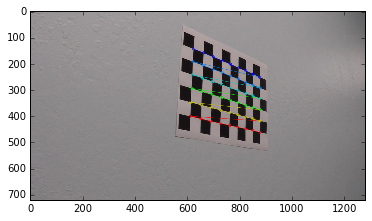

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)

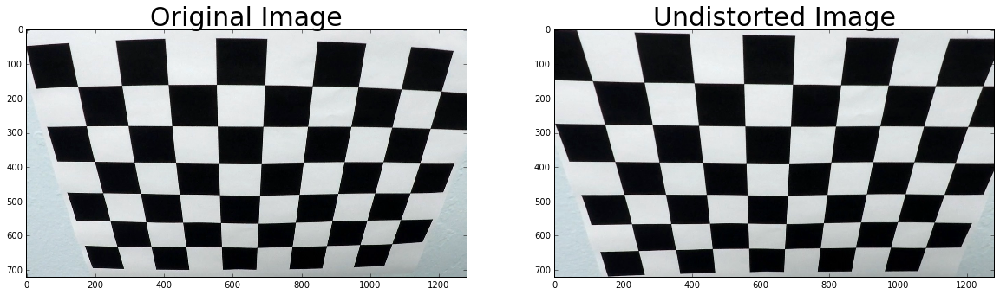

In [2]:
def bgr_to_rgb(img):
    """Applies the BGR to RGB transform"""
    b,g,r = cv2.split(img)
    img = cv2.merge((r,g,b))
    return img

def rgb_to_bgr(img):
    """Applies the RGB to BGR transform"""
    r,g,b = cv2.split(img)
    img = cv2.merge((b,g,r))

def cal_undistort(img, objpoints, imgpoints):
    """Returns undistorted image."""
    # Calibrate camera
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    # Undistort image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/undist_image.jpg',dst)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## 2. Apply a distortion correction to raw images

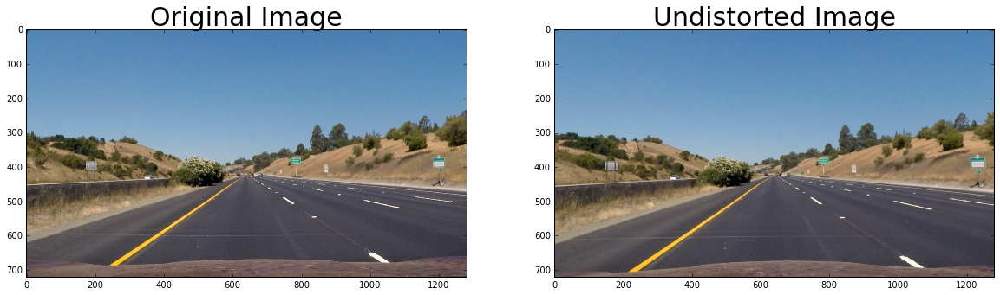

In [3]:
img = cv2.imread("test_images/straight_lines1.jpg")

dst = cv2.undistort(img, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
img = bgr_to_rgb(img)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
dst = bgr_to_rgb(dst)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## 3. Use color transforms, gradients, etc., to create a thresholded binary image

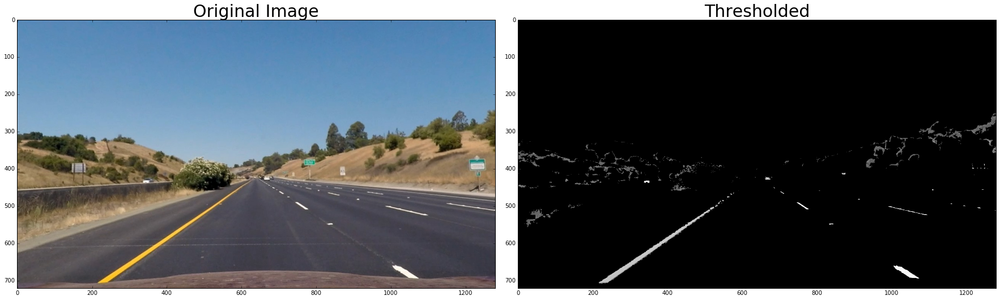

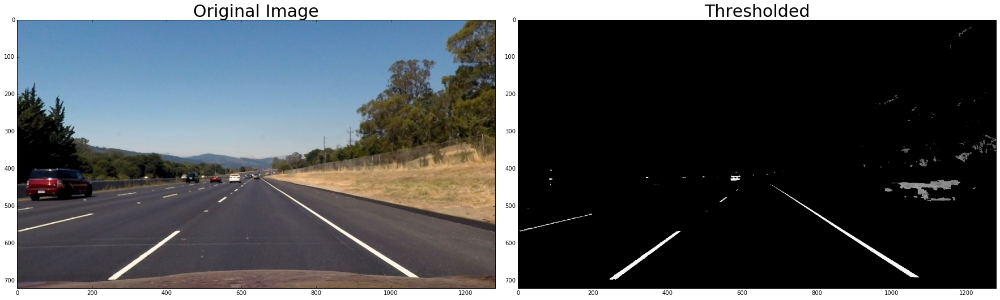

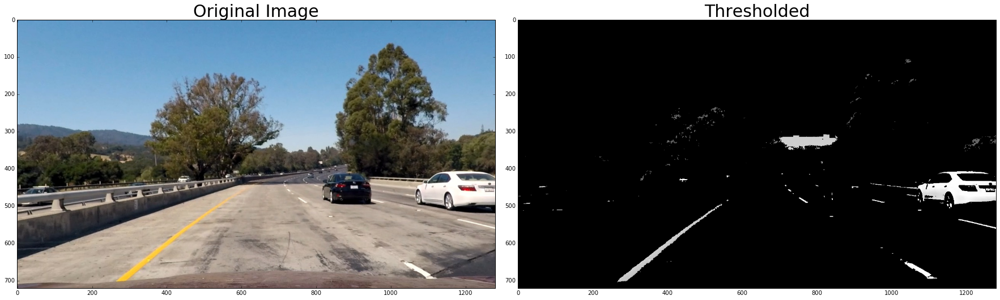

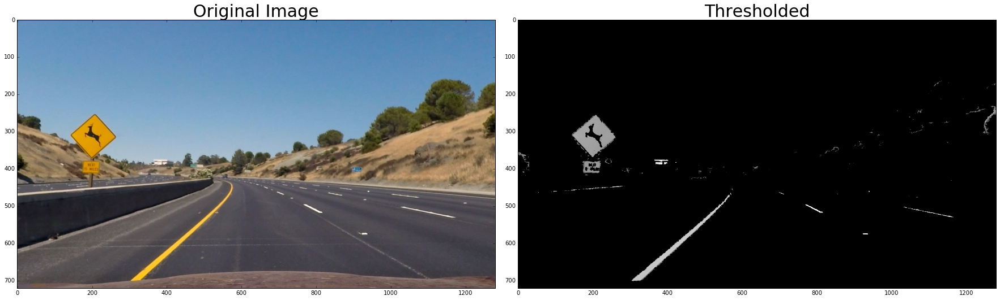

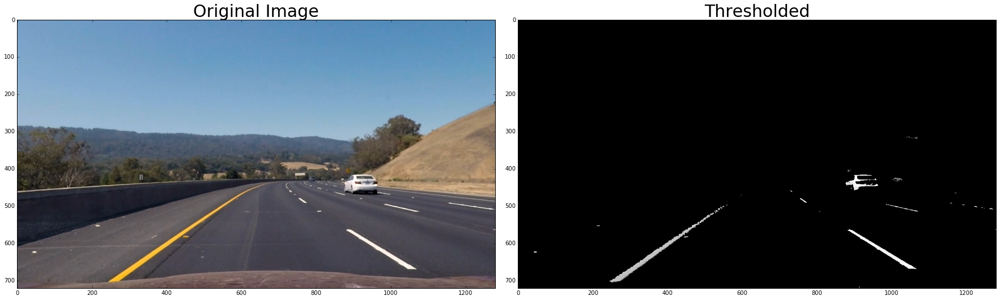

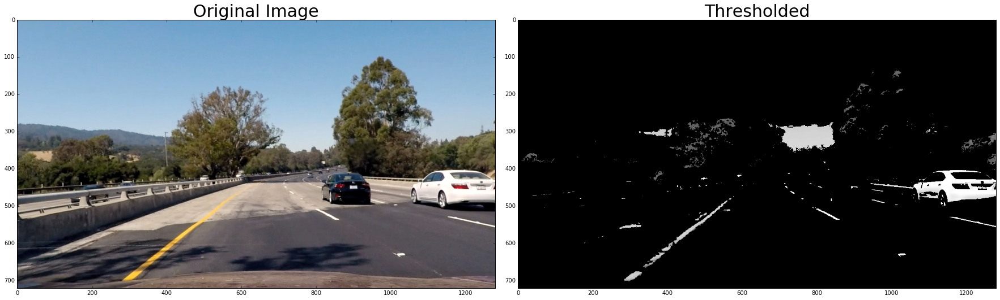

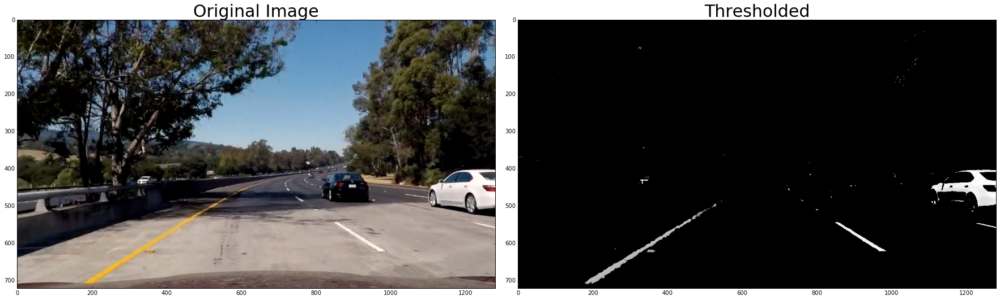

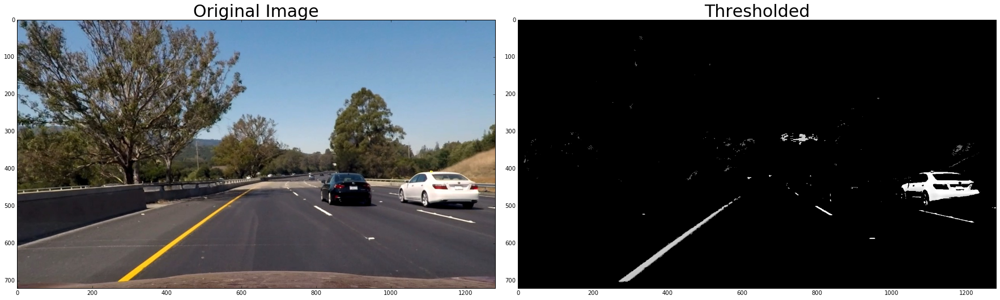

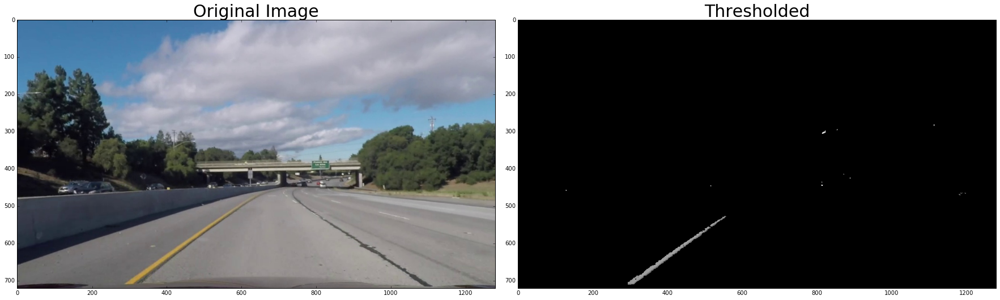

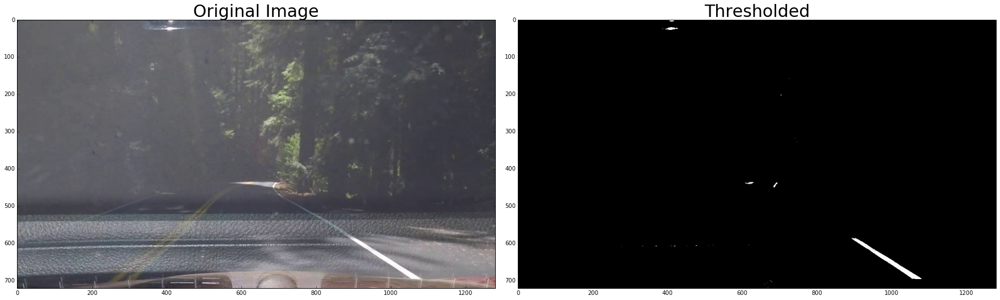

In [4]:
import os

# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def hsv(img):
    """Applies the HSV transform"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

def yellow_adn_white_filter(hsv_img, gray_img):
    #define range of color in HSV
    lower_yel = np.array([20,100,100])
    upper_yel = np.array([50,255,255])
    lower_wht = np.array([0,0,220])
    upper_wht = np.array([255,40,255])
    #threshold the HSV image to get only yellow/white 
    yellow_mask = cv2.inRange(hsv_img, lower_yel, upper_yel)
    white_mask = cv2.inRange(hsv_img, lower_wht, upper_wht)
    #bitwise-AND mask and original image
    full_mask = cv2.bitwise_or(yellow_mask, white_mask)
    filter_img = cv2.bitwise_and(gray_img, full_mask)
    return filter_img

def img_threshold(img, s_thresh=(130, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    mask = np.zeros(img.shape[:-1], dtype=np.uint8)
    mask[:,:][((scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1]))|
              ((s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]))] = 1
    return mask

for img in (os.listdir("test_images/")):
    image = cv2.imread('test_images/' + img)
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    dst = bgr_to_rgb(dst)
    image = np.copy(dst)
    #apply grayscale
    gray_img = grayscale(image)
    #apply hsv
    hsv_img = hsv(image)
    #apply yellow and white filter
    filter_img = yellow_adn_white_filter(hsv_img, gray_img)
    # Choose a Sobel kernel size
    #ksize = 3 # Choose a larger odd number to smooth gradient measurements
    #gradx = abs_sobel_thresh(image, orient='x', thresh_min=100, thresh_max=100)
    #grady = abs_sobel_thresh(image, orient='y', thresh_min=30, thresh_max=100)
    #mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(10, 100))
    #dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
    #combined = np.zeros_like(dir_binary)
    #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #hls_binary = hls_select(image, thresh=(90, 255))
    #result = img_threshold(image)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(dst)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(filter_img, cmap='gray')
    ax2.set_title('Thresholded', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 4. Apply a perspective transform to rectify binary image ("birds-eye view")

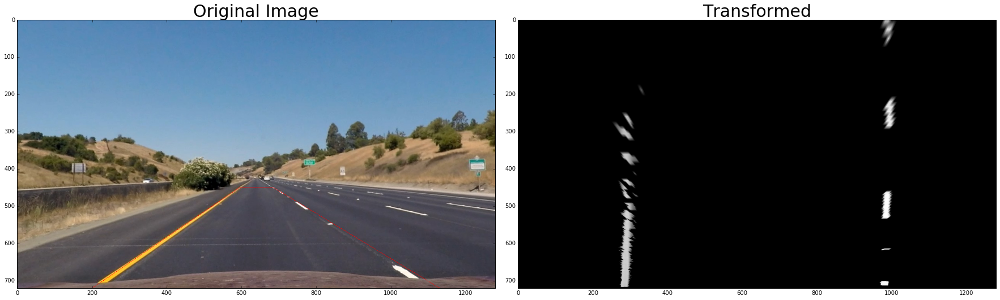

In [5]:
def perspective_transforms(src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    return M

def perspective_view(img):
    img_size = (img.shape[1], img.shape[0])
    point_src = np.float32(
        [(200,720),
         (595, 450), 
         (685,450), 
         (1130,720)])
    point_dst = np.float32(
        [(280,720),
         (280,0),
         (1000, 0),
         (1000,720)])
    M = perspective_transforms(point_src, point_dst)
    warped = cv2.warpPerspective(img, M, img_size)
    return warped
    
def perspective_unwarp(img):
    img_size = (img.shape[1], img.shape[0])
    point_src = np.float32(
        [(200,720),
         (595, 450), 
         (685,450), 
         (1130,720)])
    point_dst = np.float32(
        [(280,720),
         (280,0),
         (1000, 0),
         (1000,720)])
    M = perspective_transforms(point_dst, point_src)
    unwarped = cv2.warpPerspective(img, M, img_size)
    return unwarped
    
    
pts = np.array([[200,720],
                [595,450],
                [685,450],
                [1130,720]], np.int32)
pts = pts.reshape((-1,1,2))

img = cv2.imread("test_images/straight_lines1.jpg")
dst = cv2.undistort(img, mtx, dist, None, mtx)
dst = bgr_to_rgb(dst)
image = np.copy(dst)
gray_img = grayscale(image)
hsv_img = hsv(image)
filter_img = yellow_adn_white_filter(hsv_img, gray_img)
warped = perspective_view(filter_img) 
cv2.polylines(image,[pts],True,(255,0,0))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Transformed', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

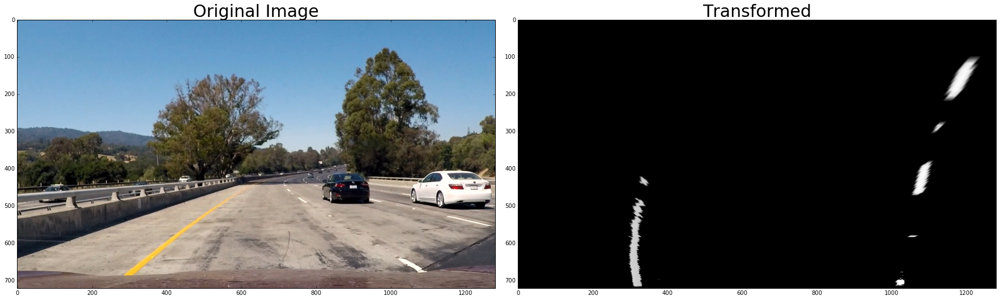

In [6]:
def pipeline(img):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    dst = bgr_to_rgb(dst)
    image = np.copy(dst)
    #apply grayscale
    gray_img = grayscale(image)
    #apply hsv
    hsv_img = hsv(image)
    #apply yellow and white filter
    filter_img = yellow_adn_white_filter(hsv_img, gray_img)
    #threshold = img_threshold(dst)
    warped = perspective_view(filter_img)  
    return warped

img = cv2.imread("test_images/test1.jpg")
binary_warped = pipeline(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = bgr_to_rgb(img)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Transformed', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [7]:
import cv2
import os

def video_to_frames(video, path_output_dir):
    # extract frames from a video and save to directory as 'x.jpg' where 
    # x is the frame index
    vidcap = cv2.VideoCapture(video)
    count = 0
    while vidcap.isOpened():
        print ("Video is processing")
        success, image = vidcap.read()
        if success:
            cv2.imwrite(os.path.join(path_output_dir, '%d.jpg') % count, image)
            count += 1
        else:
            break
    vidcap.release()

video_to_frames('harder_challenge_video.mp4', 'frames')

Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing
Video is processing


## 5. Detect lane pixels and fit to find the lane boundary

In [8]:
import numpy as np

def window(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    pixels = [leftx, lefty, rightx, righty]
    # Fit a second order polynomial to each line
    if (len(left_lane_inds)):
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        left_fit = []
    if (len(right_lane_inds)):    
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        right_fit = []
    return left_fit, right_fit, left_lane_inds, right_lane_inds, pixels

(720, 0)

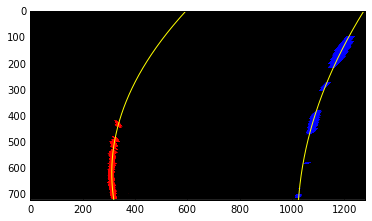

In [9]:
left_fit, right_fit, left_lane_inds, right_lane_inds, pixels = window(binary_warped)

# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [10]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
def find_lines(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit

left_fit, right_fit = find_lines(binary_warped, left_fit, right_fit)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(720, 0)

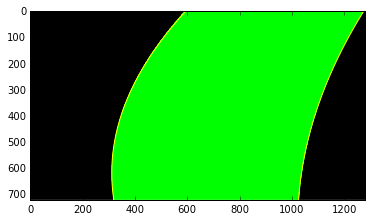

In [11]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255


# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
def gen_polygon(img, left_fitx,right_fitx, ploty):
    warp_zero = np.zeros_like(img)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    left_pts = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_pts = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((left_pts, right_pts))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    return color_warp

window_img = gen_polygon(binary_warped, left_fitx, right_fitx, ploty)
plt.imshow(window_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## 6. Determine the curvature of the lane and vehicle position with respect to center

In [12]:
def calc_curvature(pixels):
    #Read pixels list
    leftx = pixels[0]
    lefty = pixels[1]
    rightx = pixels[2]
    righty = pixels[3]
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30.0/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = 720
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    return left_curverad, right_curverad

def calc_offset(left_fitx, right_fitx, image):
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    middle = (left_fitx[-1] + right_fitx[-1])//2
    veh_pos = image.shape[1]/2
    offset = (veh_pos - middle)*xm_per_pix
    return offset

left_curverad, right_curverad = calc_curvature(pixels) 
offset = calc_offset(left_fitx, right_fitx, image)
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm', offset, 'm')

(221.85858056131713, 'm', 432.06625661964637, 'm', -0.16914285714285715, 'm')


## 7. Warp the detected lane boundaries back onto the original image

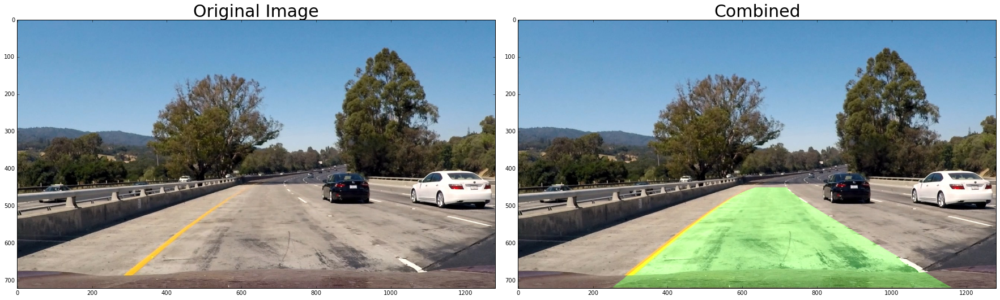

In [13]:
unwarped = perspective_unwarp(window_img)
result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result)
ax2.set_title('Combined', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

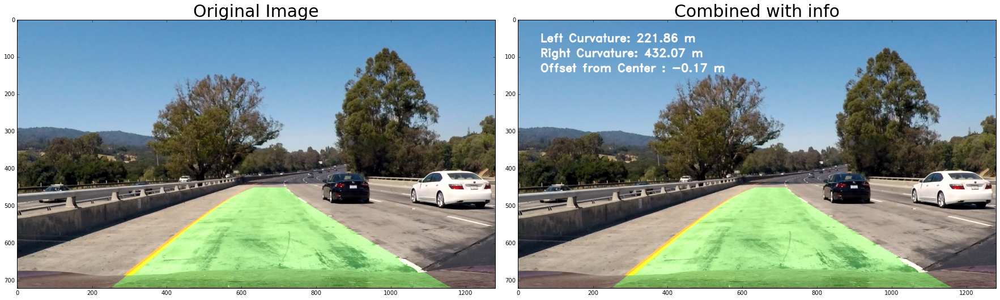

In [14]:
def show_info(image, left_curverad, right_curverad, offset):
    img = np.copy(image)
    # Add message to image
    font = cv2.FONT_HERSHEY_DUPLEX
    cv2.putText(img,'Left Curvature: %.2f m'%(left_curverad),(60,60), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(img,'Right Curvature: %.2f m'%(right_curverad),(60,100), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(img,'Offset from Center : %.2f m'%(offset),(60,140), font, 1,(255,255,255),2,cv2.LINE_AA)
    return img

result_info = show_info(result,left_curverad, right_curverad, offset)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(result)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result_info)
ax2.set_title('Combined with info', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Pipeline (video)

In [15]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

  warn(skimage_deprecation('The `skimage.filter` module has been renamed '



In [16]:
def pipeline(img):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    #threshold = img_threshold(dst)
    #dst = bgr_to_rgb(dst)
    image = np.copy(dst)
    #apply grayscale
    gray_img = grayscale(image)
    #apply hsv
    hsv_img = hsv(image)
    #apply yellow and white filter
    filter_img = yellow_adn_white_filter(hsv_img, gray_img)
    binary_warped = perspective_view(filter_img)
    left_fit, right_fit, left_lane_inds, right_lane_inds, pixels = window(binary_warped)
    #left_fit, right_fit = find_lines(binary_warped, left_fit, right_fit)
    if (len(left_fit) > 0)and(len(right_fit) > 0):
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        warped_polygon = gen_polygon(binary_warped, left_fitx, right_fitx, ploty)
        unwarped = perspective_unwarp(warped_polygon)
        image_lines = cv2.addWeighted(dst, 1, unwarped, 0.3, 0)
        left_curverad, right_curverad = calc_curvature(pixels)
        offset = calc_offset(left_fitx, right_fitx, image_lines)
    else:
        print ("lines are not found")
        image_lines = np.copy(dst)
        left_curverad = 0
        right_curverad = 0
        offset = 0
    result = show_info(image_lines, left_curverad, right_curverad, offset)
    return result

def process_image(image):
    result = pipeline(image)
    return result

In [19]:
project_output = 'project_video_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████████████████████████████████▉| 1260/1261 [06:49<00:00,  3.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

Wall time: 6min 53s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [35]:
project_output = 'challenge_video_out.mp4'
clip1 = VideoFileClip('challenge_video.mp4')
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4






  0%|                                                  | 0/485 [00:00<?, ?it/s]



  0%|                                          | 1/485 [00:00<02:24,  3.34it/s]



  0%|▏                                         | 2/485 [00:00<02:18,  3.49it/s]



  1%|▎                                         | 3/485 [00:00<02:09,  3.71it/s]



  1%|▎                                         | 4/485 [00:01<02:04,  3.87it/s]



  1%|▍                                         | 5/485 [00:01<02:04,  3.84it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)

  warnings.warn(msg, RankWarning)





  1%|▌                                         | 6/485 [00:01<02:06,  3.77it/s]

lines are not found






  1%|▌                                         | 7/485 [00:01<02:15,  3.54it/s]

lines are not found






  2%|▋                                         | 8/485 [00:02<02:04,  3.82it/s]

lines are not found






  2%|▊                                         | 9/485 [00:02<01:55,  4.11it/s]

lines are not found






  2%|▊                                        | 10/485 [00:02<01:53,  4.20it/s]

lines are not found






  2%|▉                                        | 11/485 [00:02<01:59,  3.96it/s]

lines are not found






  2%|█                                        | 12/485 [00:03<01:56,  4.05it/s]

lines are not found






  3%|█                                        | 13/485 [00:03<01:57,  4.00it/s]

lines are not found






  3%|█▏                                       | 14/485 [00:03<02:13,  3.54it/s]

lines are not found






  3%|█▎                                       | 15/485 [00:03<02:07,  3.68it/s]

lines are not found






  3%|█▎                                       | 16/485 [00:04<02:10,  3.60it/s]



  4%|█▍                                       | 17/485 [00:04<02:18,  3.38it/s]



  4%|█▌                                       | 18/485 [00:04<02:25,  3.21it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)

  warnings.warn(msg, RankWarning)





  4%|█▌                                       | 19/485 [00:05<02:36,  2.99it/s]



  4%|█▋                                       | 20/485 [00:05<03:01,  2.57it/s]



  4%|█▊                                       | 21/485 [00:06<02:40,  2.89it/s]



  5%|█▊                                       | 22/485 [00:06<02:23,  3.23it/s]



  5%|█▉                                       | 23/485 [00:06<02:14,  3.44it/s]



  5%|██                                       | 24/485 [00:06<02:05,  3.68it/s]



  5%|██                                       | 25/4

lines are not found






 13%|█████▍                                   | 64/485 [00:19<01:47,  3.91it/s]



 13%|█████▍                                   | 65/485 [00:19<01:50,  3.81it/s]



 14%|█████▌                                   | 66/485 [00:20<01:46,  3.94it/s]



 14%|█████▋                                   | 67/485 [00:20<01:42,  4.07it/s]



 14%|█████▋                                   | 68/485 [00:20<01:53,  3.68it/s]



 14%|█████▊                                   | 69/485 [00:20<01:49,  3.81it/s]



 14%|█████▉                                   | 70/485 [00:21<01:49,  3.78it/s]



 15%|██████                                   | 71/485 [00:21<01:46,  3.87it/s]



 15%|██████                                   | 72/485 [00:21<01:45,  3.93it/s]



 15%|██████▏                                  | 73/485 [00:21<01:44,  3.95it/s]



 15%|██████▎                                  | 74/485 [00:22<01:45,  3.91it/s]



 15%|██████▎                                  | 75/485 [00:22<01:42,  4.00it/s]





lines are not found






 28%|███████████                             | 134/485 [00:45<01:52,  3.12it/s]

lines are not found






 28%|███████████▏                            | 135/485 [00:45<01:49,  3.20it/s]

lines are not found






 28%|███████████▏                            | 136/485 [00:46<01:48,  3.21it/s]

lines are not found






 28%|███████████▎                            | 137/485 [00:46<01:49,  3.17it/s]

lines are not found






 28%|███████████▍                            | 138/485 [00:46<01:48,  3.20it/s]

lines are not found






 29%|███████████▍                            | 139/485 [00:46<01:43,  3.36it/s]

lines are not found






 29%|███████████▌                            | 140/485 [00:47<01:39,  3.47it/s]

lines are not found






 29%|███████████▋                            | 141/485 [00:47<01:47,  3.21it/s]

lines are not found






 29%|███████████▋                            | 142/485 [00:47<01:37,  3.52it/s]

lines are not found






 29%|███████████▊                            | 143/485 [00:48<01:49,  3.13it/s]

lines are not found






 30%|███████████▉                            | 144/485 [00:48<01:41,  3.36it/s]

lines are not found






 30%|███████████▉                            | 145/485 [00:48<01:44,  3.24it/s]

lines are not found






 30%|████████████                            | 146/485 [00:49<01:38,  3.44it/s]

lines are not found






 30%|████████████                            | 147/485 [00:49<01:30,  3.73it/s]

lines are not found






 31%|████████████▏                           | 148/485 [00:49<01:32,  3.66it/s]

lines are not found






 31%|████████████▎                           | 149/485 [00:49<01:34,  3.57it/s]



 31%|████████████▎                           | 150/485 [00:50<01:37,  3.42it/s]



 31%|████████████▍                           | 151/485 [00:50<01:39,  3.37it/s]



 31%|████████████▌                           | 152/485 [00:50<01:46,  3.12it/s]



 32%|████████████▌                           | 153/485 [00:51<01:44,  3.16it/s]



 32%|████████████▋                           | 154/485 [00:51<01:44,  3.15it/s]



 32%|████████████▊                           | 155/485 [00:51<01:44,  3.17it/s]



 32%|████████████▊                           | 156/485 [00:52<01:44,  3.15it/s]



 32%|████████████▉                           | 157/485 [00:53<02:59,  1.83it/s]



 33%|█████████████                           | 158/485 [00:53<02:48,  1.94it/s]



 33%|█████████████                           | 159/485 [00:54<02:35,  2.10it/s]



 33%|█████████████▏                          | 160/485 [00:54<02:18,  2.34it/s]





lines are not found






 62%|████████████████████████▋               | 299/485 [01:54<01:05,  2.83it/s]

lines are not found






 62%|████████████████████████▋               | 300/485 [01:54<01:00,  3.07it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)

  warnings.warn(msg, RankWarning)





 62%|████████████████████████▊               | 301/485 [01:55<00:59,  3.08it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)

  warnings.warn(msg, RankWarning)





 62%|████████████████████████▉               | 302/485 [01:55<00:58,  3.11it/s]



 62%|████████████████████████▉               | 303/485 [01:55<00:55,  3.25it/s]



 63%|█████████████████████████               | 304/485 [01:55<00:54,  3.34it/s]



 63%|█████████████████████████▏              | 305/485 [01:56<01:00,  2.99it/s]



 63%|█████████████████████████▏              | 306/485 [01:56<01:00,  2.96it/s]



 63%|████████████████

lines are not found






 67%|██████████████████████████▉             | 326/485 [02:07<00:54,  2.90it/s]



 67%|██████████████████████████▉             | 327/485 [02:07<00:52,  2.98it/s]



 68%|███████████████████████████             | 328/485 [02:08<00:50,  3.09it/s]



 68%|███████████████████████████▏            | 329/485 [02:08<00:47,  3.25it/s]



 68%|███████████████████████████▏            | 330/485 [02:08<00:46,  3.30it/s]



 68%|███████████████████████████▎            | 331/485 [02:09<00:44,  3.45it/s]



 68%|███████████████████████████▍            | 332/485 [02:09<00:42,  3.58it/s]



 69%|███████████████████████████▍            | 333/485 [02:09<00:43,  3.47it/s]



 69%|███████████████████████████▌            | 334/485 [02:09<00:43,  3.46it/s]



 69%|███████████████████████████▋            | 335/485 [02:10<00:49,  3.05it/s]



 69%|███████████████████████████▋            | 336/485 [02:10<00:47,  3.16it/s]



 69%|███████████████████████████▊            | 337/485 [02:10<00:48,  3.04it/s]





lines are not found






 70%|████████████████████████████            | 341/485 [02:12<00:40,  3.53it/s]



 71%|████████████████████████████▏           | 342/485 [02:12<00:40,  3.50it/s]



 71%|████████████████████████████▎           | 343/485 [02:12<00:38,  3.67it/s]



 71%|████████████████████████████▎           | 344/485 [02:13<00:44,  3.16it/s]



 71%|████████████████████████████▍           | 345/485 [02:13<00:41,  3.40it/s]



 71%|████████████████████████████▌           | 346/485 [02:13<00:43,  3.19it/s]



 72%|████████████████████████████▌           | 347/485 [02:13<00:42,  3.28it/s]



 72%|████████████████████████████▋           | 348/485 [02:14<00:39,  3.48it/s]



 72%|████████████████████████████▊           | 349/485 [02:14<00:37,  3.64it/s]



 72%|████████████████████████████▊           | 350/485 [02:14<00:38,  3.49it/s]



 72%|████████████████████████████▉           | 351/485 [02:15<00:37,  3.55it/s]



 73%|█████████████████████████████           | 352/485 [02:15<00:36,  3.69it/s]





lines are not found






 96%|██████████████████████████████████████▎ | 465/485 [02:54<00:05,  3.52it/s]

lines are not found






 96%|██████████████████████████████████████▍ | 466/485 [02:54<00:05,  3.75it/s]



 96%|██████████████████████████████████████▌ | 467/485 [02:54<00:04,  3.78it/s]



 96%|██████████████████████████████████████▌ | 468/485 [02:54<00:04,  3.79it/s]



 97%|██████████████████████████████████████▋ | 469/485 [02:54<00:04,  3.87it/s]



 97%|██████████████████████████████████████▊ | 470/485 [02:55<00:04,  3.67it/s]



 97%|██████████████████████████████████████▊ | 471/485 [02:55<00:03,  3.69it/s]



 97%|██████████████████████████████████████▉ | 472/485 [02:55<00:03,  3.81it/s]



 98%|███████████████████████████████████████ | 473/485 [02:56<00:03,  3.84it/s]



 98%|███████████████████████████████████████ | 474/485 [02:56<00:02,  3.74it/s]



 98%|███████████████████████████████████████▏| 475/485 [02:56<00:02,  3.85it/s]



 98%|███████████████████████████████████████▎| 476/485 [02:56<00:02,  3.53it/s]



 98%|███████████████████████████████████████▎| 477/485 [02:57<00:02,  3.61it/s]





lines are not found






 99%|███████████████████████████████████████▌| 479/485 [02:57<00:01,  3.79it/s]

lines are not found






 99%|███████████████████████████████████████▌| 480/485 [02:57<00:01,  3.96it/s]

lines are not found






 99%|███████████████████████████████████████▋| 481/485 [02:58<00:00,  4.07it/s]

lines are not found






 99%|███████████████████████████████████████▊| 482/485 [02:58<00:00,  4.17it/s]



100%|███████████████████████████████████████▊| 483/485 [02:58<00:00,  4.01it/s]



100%|███████████████████████████████████████▉| 484/485 [02:58<00:00,  3.88it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\moviepy\video\io\ffmpeg_reader.py:116: UserWarning: Warning: in file challenge_video.mp4, 2764800 bytes wanted but 0 bytes read,at frame 484/485, at time 16.15/16.15 sec. Using the last valid frame instead.
  UserWarning)





100%|████████████████████████████████████████| 485/485 [02:59<00:00,  3.91it/s]





[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 

Wall time: 3min 2s


In [36]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [37]:
project_output = 'harder_challenge_video_out.mp4'
clip1 = VideoFileClip('harder_challenge_video.mp4')
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4






  0%|                                                 | 0/1200 [00:00<?, ?it/s]



  0%|                                         | 1/1200 [00:00<05:51,  3.41it/s]



  0%|                                         | 2/1200 [00:00<06:03,  3.29it/s]



  0%|                                         | 3/1200 [00:01<06:37,  3.01it/s]



  0%|▏                                        | 4/1200 [00:01<06:28,  3.07it/s]



  0%|▏                                        | 5/1200 [00:01<06:24,  3.11it/s]



  0%|▏                                        | 6/1200 [00:01<06:06,  3.26it/s]



  1%|▏                                        | 7/1200 [00:02<05:58,  3.33it/s]



  1%|▎                                        | 8/1200 [00:02<06:13,  3.19it/s]



  1%|▎                                        | 9/1200 [00:02<06:45,  2.93it/s]



  1%|▎                                       | 10/1200 [00:03<07:43,  2.57it/s]



  1%|▎                                       | 11/1200 [00:03<07:15,  2.73it/s]





lines are not found






 49%|███████████████████▏                   | 590/1200 [04:13<05:08,  1.98it/s]

lines are not found






 49%|███████████████████▏                   | 591/1200 [04:14<04:19,  2.35it/s]

lines are not found






 49%|███████████████████▏                   | 592/1200 [04:14<03:39,  2.77it/s]



 49%|███████████████████▎                   | 593/1200 [04:14<03:44,  2.70it/s]



 50%|███████████████████▎                   | 594/1200 [04:15<04:09,  2.43it/s]



 50%|███████████████████▎                   | 595/1200 [04:15<03:34,  2.82it/s]



 50%|███████████████████▎                   | 596/1200 [04:16<05:28,  1.84it/s]



 50%|███████████████████▍                   | 597/1200 [04:16<05:22,  1.87it/s]



 50%|███████████████████▍                   | 598/1200 [04:17<04:29,  2.23it/s]



 50%|███████████████████▍                   | 599/1200 [04:17<04:40,  2.14it/s]



 50%|███████████████████▌                   | 600/1200 [04:18<04:28,  2.24it/s]



 50%|███████████████████▌                   | 601/1200 [04:18<04:10,  2.39it/s]



 50%|███████████████████▌                   | 602/1200 [04:18<03:37,  2.74it/s]



 50%|███████████████████▌                   | 603/1200 [04:19<03:49,  2.61it/s]





lines are not found






 51%|███████████████████▋                   | 607/1200 [04:21<04:44,  2.09it/s]

lines are not found






 51%|███████████████████▊                   | 608/1200 [04:21<04:54,  2.01it/s]

lines are not found






 51%|███████████████████▊                   | 609/1200 [04:22<06:10,  1.59it/s]



 51%|███████████████████▊                   | 610/1200 [04:23<06:31,  1.51it/s]



 51%|███████████████████▊                   | 611/1200 [04:23<05:56,  1.65it/s]



 51%|███████████████████▉                   | 612/1200 [04:24<05:10,  1.89it/s]



 51%|███████████████████▉                   | 613/1200 [04:24<04:47,  2.04it/s]



 51%|███████████████████▉                   | 614/1200 [04:25<04:23,  2.22it/s]



 51%|███████████████████▉                   | 615/1200 [04:25<04:08,  2.35it/s]



 51%|████████████████████                   | 616/1200 [04:25<04:10,  2.33it/s]



 51%|████████████████████                   | 617/1200 [04:26<04:39,  2.09it/s]



 52%|████████████████████                   | 618/1200 [04:26<04:29,  2.16it/s]



 52%|████████████████████                   | 619/1200 [04:27<04:08,  2.34it/s]



 52%|████████████████████▏                  | 620/1200 [04:27<03:57,  2.45it/s]





lines are not found






 77%|█████████████████████████████▉         | 922/1200 [06:37<01:55,  2.41it/s]

lines are not found






 77%|█████████████████████████████▉         | 923/1200 [06:37<01:39,  2.77it/s]

lines are not found






 77%|██████████████████████████████         | 924/1200 [06:38<01:27,  3.16it/s]

lines are not found






 77%|██████████████████████████████         | 925/1200 [06:38<01:23,  3.31it/s]

lines are not found






 77%|██████████████████████████████         | 926/1200 [06:38<01:21,  3.37it/s]

lines are not found






 77%|██████████████████████████████▏        | 927/1200 [06:39<01:38,  2.77it/s]

lines are not found






 77%|██████████████████████████████▏        | 928/1200 [06:39<01:31,  2.97it/s]

lines are not found






 77%|██████████████████████████████▏        | 929/1200 [06:39<01:28,  3.07it/s]

lines are not found






 78%|██████████████████████████████▏        | 930/1200 [06:39<01:19,  3.40it/s]

lines are not found






 78%|██████████████████████████████▎        | 931/1200 [06:40<01:13,  3.65it/s]

lines are not found






 78%|██████████████████████████████▎        | 932/1200 [06:40<01:09,  3.86it/s]

lines are not found






 78%|██████████████████████████████▎        | 933/1200 [06:40<01:08,  3.88it/s]

lines are not found






 78%|██████████████████████████████▎        | 934/1200 [06:41<01:34,  2.82it/s]

lines are not found






 78%|██████████████████████████████▍        | 935/1200 [06:41<01:30,  2.94it/s]

lines are not found






 78%|██████████████████████████████▍        | 936/1200 [06:41<01:29,  2.96it/s]

lines are not found






 78%|██████████████████████████████▍        | 937/1200 [06:42<01:22,  3.18it/s]

lines are not found






 78%|██████████████████████████████▍        | 938/1200 [06:42<01:35,  2.76it/s]

lines are not found






 78%|██████████████████████████████▌        | 939/1200 [06:42<01:28,  2.96it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)

  warnings.warn(msg, RankWarning)





 78%|██████████████████████████████▌        | 940/1200 [06:43<01:30,  2.87it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)

  warnings.warn(msg, RankWarning)





 78%|██████████████████████████████▌        | 941/1200 [06:43<01:27,  2.97it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:594: RankWarning: Polyfit may be poorly conditioned
  warnings.warn(msg, RankWarning)

  warnings.warn(msg, RankWarning)





 78%|██████████████████████████████▌        | 942/1200 [06:43<01:22,  3.12it/s]WARNING:py.warnings:I:\Anaconda2\lib\site-packages\numpy\lib\polynomial.py:59

[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

Wall time: 8min 26s


In [24]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))